# Advanced Lane Finding Project

In this project, your goal is to write a software pipeline to identify the lane boundaries in a video, but the main output or product we want you to create is a detailed writeup of the project. Check out the writeup template for this project and use it as a starting point for creating your own writeup.

The goals / steps of this project are the following:

Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
Apply a distortion correction to raw images.
Use color transforms, gradients, etc., to create a thresholded binary image.
Apply a perspective transform to rectify binary image ("birds-eye view").
Detect lane pixels and fit to find the lane boundary.
Determine the curvature of the lane and vehicle position with respect to center.
Warp the detected lane boundaries back onto the original image.
Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position..

## We import the useful packages and the command to show pictures inline

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib
import numpy as np
import cv2
import glob
%matplotlib inline

In [4]:
cd C:\Users\marti\CarND-Advanced-Lane-Lines-master\CarND-Advanced-Lane-Lines-master

C:\Users\marti\CarND-Advanced-Lane-Lines-master\CarND-Advanced-Lane-Lines-master


## We show the "straight_line" and "Test" pictures to what kind of images we are dealing with

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


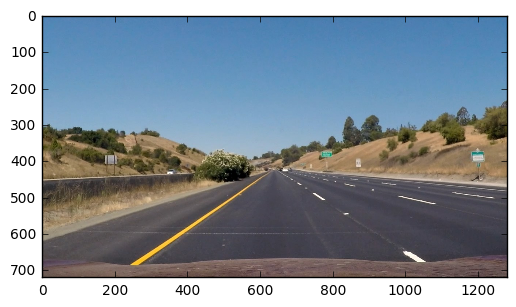

In [5]:
#reading in an image
image = mpimg.imread('test_images/straight_lines1.jpg')
#printing out some stats and plotting
print('This image is:', type(image), 'with dimesions:', image.shape)
plt.imshow(image)  #call as plt.imshow(gray, cmap='gray') to show a grayscaled image

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


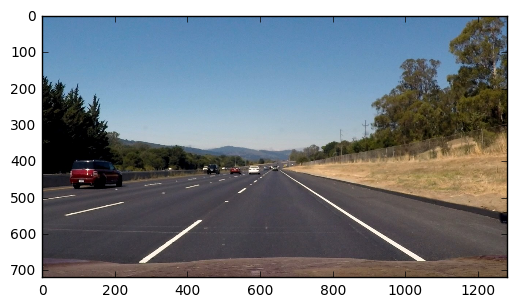

In [6]:
#reading in an image
image = mpimg.imread('test_images/straight_lines2.jpg')
#printing out some stats and plotting
print('This image is:', type(image), 'with dimesions:', image.shape)
plt.imshow(image)  #call as plt.imshow(gray, cmap='gray') to show a grayscaled image

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


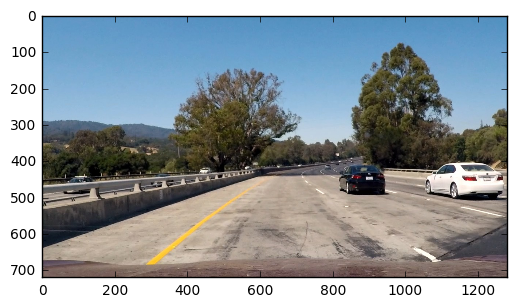

In [7]:
#reading in an image
image = mpimg.imread('test_images/test1.jpg')
#printing out some stats and plotting
print('This image is:', type(image), 'with dimesions:', image.shape)
plt.imshow(image)  #call as plt.imshow(gray, cmap='gray') to show a grayscaled image

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


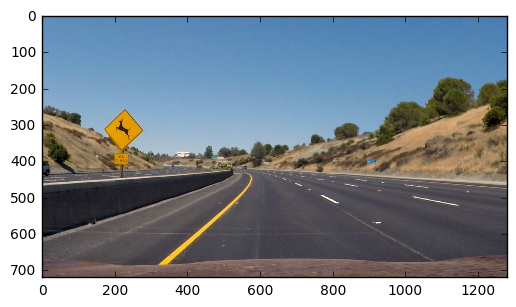

In [8]:
#reading in an image
image = mpimg.imread('test_images/test2.jpg')
#printing out some stats and plotting
print('This image is:', type(image), 'with dimesions:', image.shape)
plt.imshow(image)  #call as plt.imshow(gray, cmap='gray') to show a grayscaled image

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


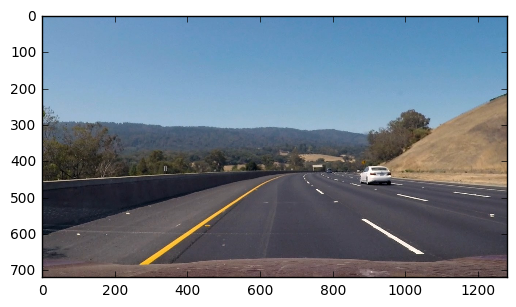

In [9]:
#reading in an image
image = mpimg.imread('test_images/test3.jpg')
#printing out some stats and plotting
print('This image is:', type(image), 'with dimesions:', image.shape)
plt.imshow(image)  #call as plt.imshow(gray, cmap='gray') to show a grayscaled image

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


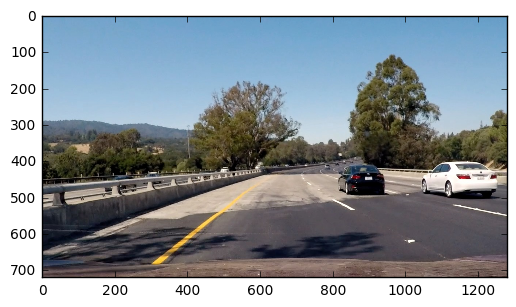

In [10]:
#reading in an image
image = mpimg.imread('test_images/test4.jpg')
#printing out some stats and plotting
print('This image is:', type(image), 'with dimesions:', image.shape)
plt.imshow(image)  #call as plt.imshow(gray, cmap='gray') to show a grayscaled image

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


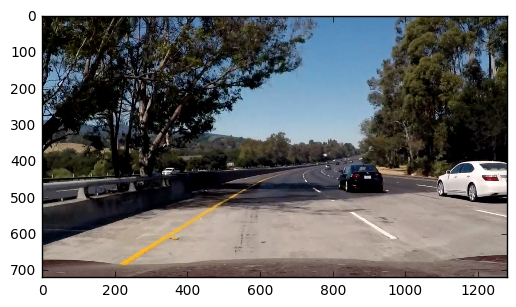

In [11]:
#reading in an image
image = mpimg.imread('test_images/test5.jpg')
#printing out some stats and plotting
print('This image is:', type(image), 'with dimesions:', image.shape)
plt.imshow(image)  #call as plt.imshow(gray, cmap='gray') to show a grayscaled image

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


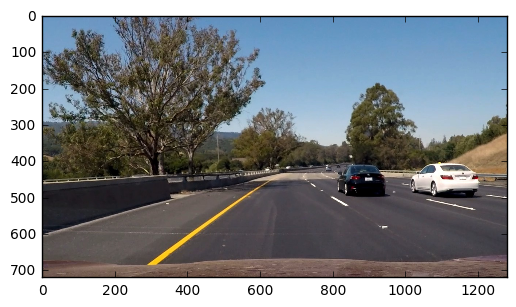

In [12]:
#reading in an image
image = mpimg.imread('test_images/test6.jpg')
#printing out some stats and plotting
print('This image is:', type(image), 'with dimesions:', image.shape)
plt.imshow(image)  #call as plt.imshow(gray, cmap='gray') to show a grayscaled image

### Function to vonvert the image to grey scale and to use cv2.calibrateCamera and cv2.undistort()

In [13]:
def cal_undistort(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    shape = gray.shape[::-1]
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, shape,None,None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

### Chessboard image undistortion

Total of calibration images:  20


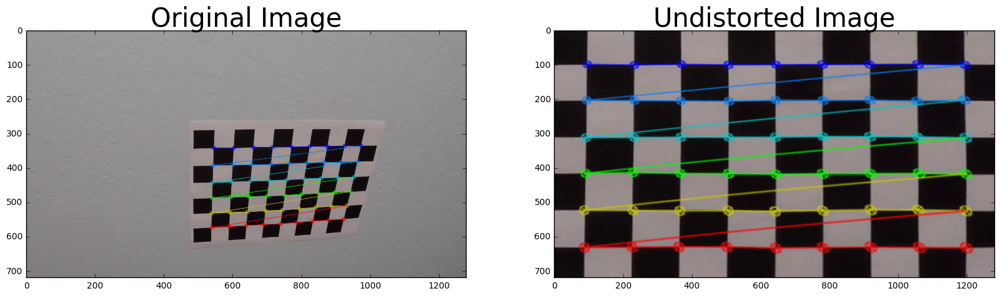

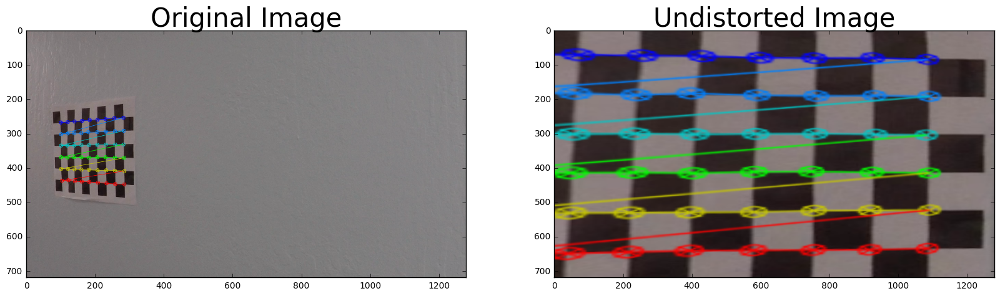

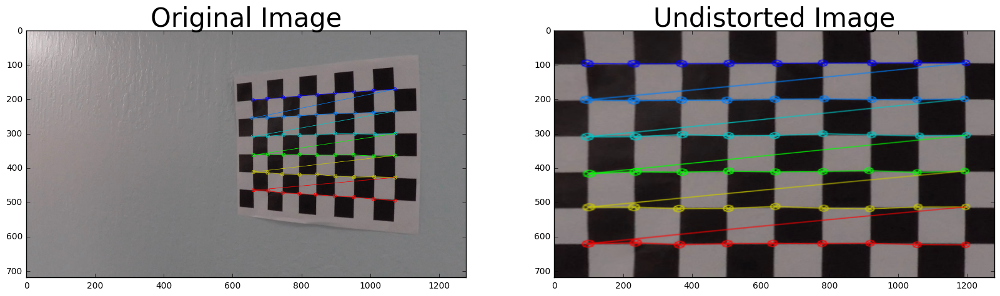

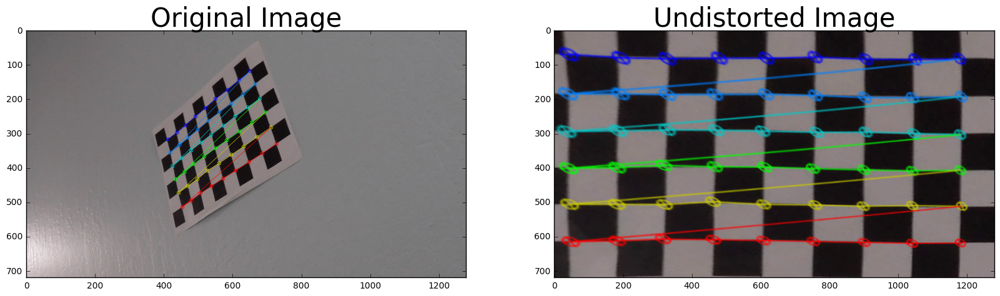

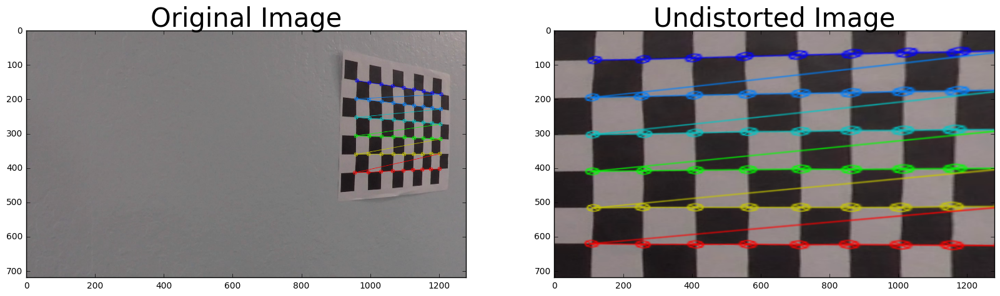

...

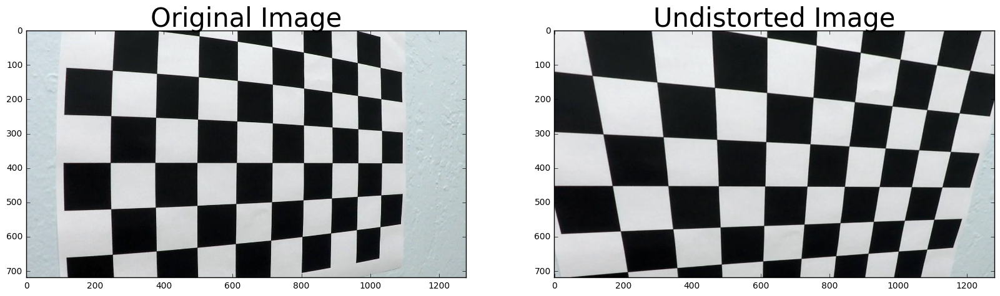

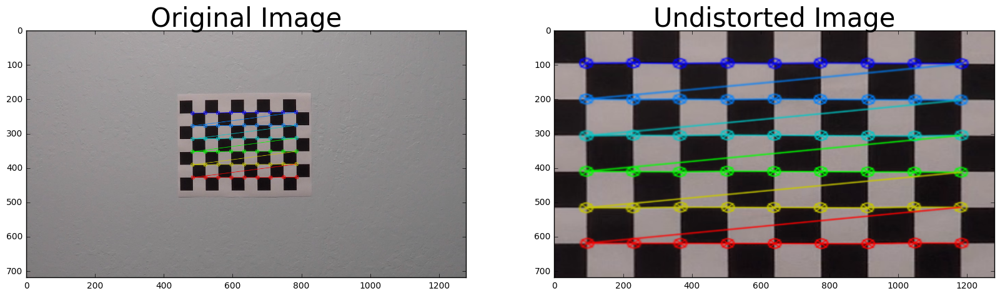

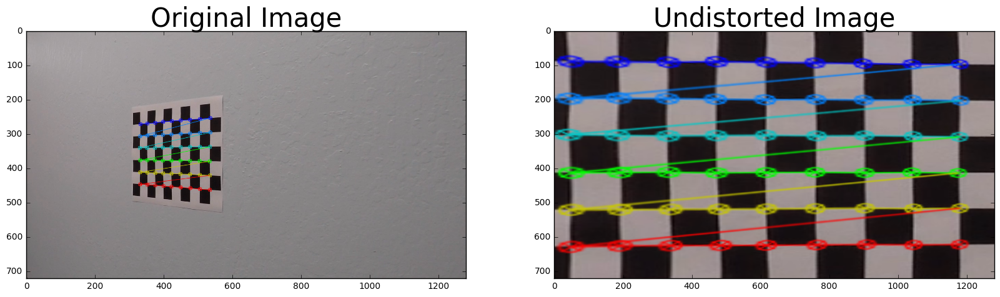

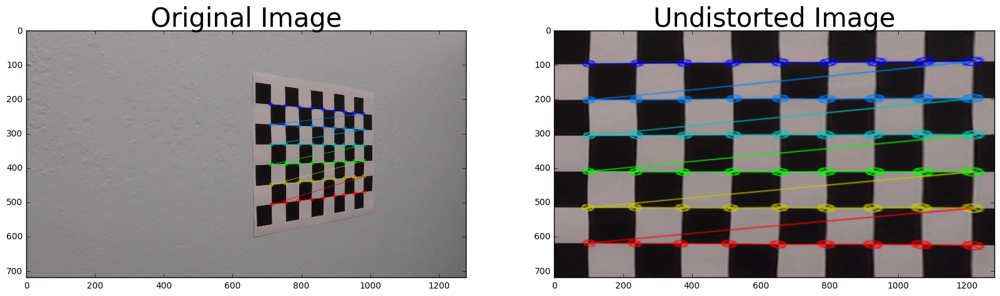

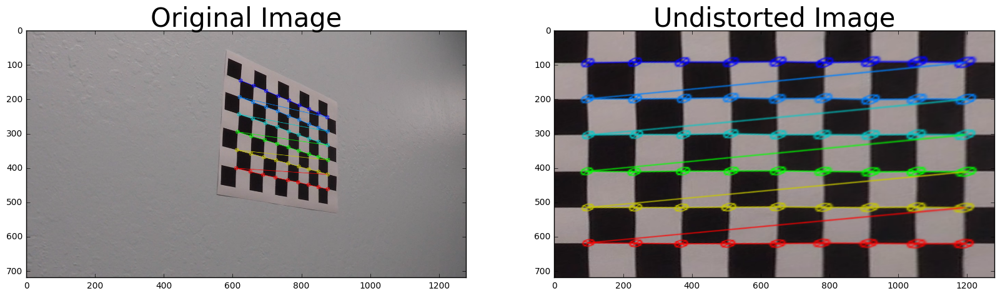

In [14]:
# We now prepare the object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# We create arrays to store our object points and image points from all the availadble images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

nx = 9
ny = 6

# Now we make a list of al the availadble calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

print('Total of calibration images: ', len(images))

# We use a for loop to go through the list to search for chessboard corners, draw and display the corners 
# and finally we calculate the perspective transform matrix before plotting the output.
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)

    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        offset = 100 # offset for dst points
        img_size = (gray.shape[1], gray.shape[0])
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        
        M = cv2.getPerspectiveTransform(src, dst)
        
    if objpoints and imgpoints:
        undistwarped_img = cal_undistort(img, objpoints, imgpoints)
        warped = cv2.warpPerspective(undistwarped_img, M, img_size)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(warped)
        ax2.set_title('Undistorted Image', fontsize=30)